In [0]:
!test ! -f "master.zip" && wget "https://github.com/karoldvl/ESC-50/archive/master.zip"

--2019-09-19 09:59:33--  https://github.com/karoldvl/ESC-50/archive/master.zip
Resolving github.com (github.com)... 192.30.253.112
Connecting to github.com (github.com)|192.30.253.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/karoldvl/ESC-50/zip/master [following]
--2019-09-19 09:59:34--  https://codeload.github.com/karoldvl/ESC-50/zip/master
Resolving codeload.github.com (codeload.github.com)... 192.30.253.121
Connecting to codeload.github.com (codeload.github.com)|192.30.253.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [       <=>          ] 615.78M  12.0MB/s    in 49s     

2019-09-19 10:00:23 (12.6 MB/s) - ‘master.zip’ saved [645693466]



In [0]:
from google.colab import drive
!mkdir gdrive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
!unzip -qq master.zip

In [0]:
!ls

ESC-50-master  gdrive  master.zip  sample_data


In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai.vision import *
from fastai.metrics import accuracy,error_rate
import pandas as pd

In [0]:
bs=16
val_fold=5
df = pd.read_csv('ESC-50-master/meta/esc50.csv')

In [0]:
df['is_valid']=(df['fold']==val_fold)
df.head()

,filename,fold,target,category,esc10,src_file,take,is_valid
0,1-100032-A-0.wav,1,0,dog,True,100032,A,False
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A,False
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A,False
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B,False
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A,False


In [0]:
import librosa
import numpy as np
def mono_to_color(X, mean=None, std=None, norm_max=None, norm_min=None, eps=1e-6):
    # Stack X as [X,X,X]
    X = np.stack([X, X, X], axis=-1)

    # Standardize
    mean = mean or X.mean()
    std = std or X.std()
    Xstd = (X - mean) / (std + eps)
    _min, _max = Xstd.min(), Xstd.max()
    norm_max = norm_max or _max
    norm_min = norm_min or _min
    if (_max - _min) > eps:
        # Scale to [0, 255]
        V = Xstd
        V[V < norm_min] = norm_min
        V[V > norm_max] = norm_max
        V = 255 * (V - norm_min) / (norm_max - norm_min)
        V = V.astype(np.uint8)
    else:
        # Just zero
        V = np.zeros_like(Xstd, dtype=np.uint8)
    return V

def spectrogram(file_path,params):
    wav,sr = librosa.load(file_path,sr=params.sr)
    if wav.shape[0]<5*params.sr:
      wav=np.pad(wav,int(np.ceil((5*params.sr-wav.shape[0])/2)),mode='reflect')
    wav=wav[:5*params.sr]
    spec=librosa.feature.melspectrogram(wav, sr=sr, n_fft=params.n_fft,
                hop_length=params.hop_length,n_mels=params.n_mels,fmin=params.fmin,fmax=params.fmax)
    specdb=librosa.power_to_db(spec,top_db=params.top_db)
    return np.rollaxis(mono_to_color(specdb),2,0)
class Params():
  
    def __init__(self, json_path):
        self.update(json_path)

    def save(self, json_path):
        with open(json_path, 'w') as f:
            json.dump(self.__dict__, f, indent=4)

    def update(self, json_path):
        with open(json_path) as f:
            params = json.load(f)
            self.__dict__.update(params)

    @property
    def dict(self):
        return self.__dict__
def load_params(params_path):
    json_path = os.path.join(params_path, 'params.json')
    assert os.path.isfile(json_path), "No json configuration file found at {}".format(json_path)
    return Params(json_path)

with open('params.json','w') as f:
  f.write("""{
    "hop_length": 512,
    "n_mels": 128,
    "n_fft": 1024,
    "top_db": 80,
    "fmin": 20,
    "fmax": 8300,
    "sr":16000

}
""")



In [0]:
import librosa
import numpy as np

import tqdm
bs=16
params=load_params('./')
class AudioPreProcessor(PreProcessor):
    def __init__(self,base_path,**kwargs):
        super().__init__(**kwargs)
        self.base_path=base_path
    def process_one(self, item):
        return spectrogram(os.path.join(self.base_path,item),params).astype(np.double)
    def process(self, ds:Collection):
        ds.items = array([self.process_one(item) for item in tqdm.tqdm_notebook(ds.items)])


In [0]:
import fastai

In [0]:
db=(ItemList.from_df(df,'ESC-50-master/',processor=AudioPreProcessor('ESC-50-master/audio'))\
            .split_from_df(7)\
            .label_from_df('category')\
            .transform(tfms=None)\
            .databunch(bs=16))

In [0]:
db.x[0].shape

(3, 128, 431)

In [0]:
learn.purge()
learn = cnn_learner(db, models.resnet18, metrics=[accuracy],callback_fns=ShowGraph, pretrained=True)

In [0]:
learn.model.to(device='cuda')
learn.model.double()

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 7.59E-03
Min loss divided by 10: 4.79E-03


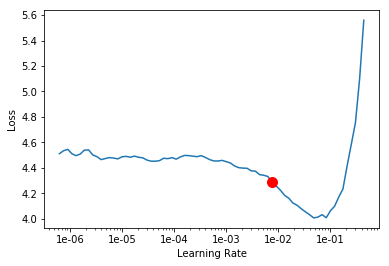

In [0]:
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,accuracy,time
0,3.478545,2.522372,0.392500,00:29
1,2.250190,1.750244,0.522500,00:29
2,1.595133,1.653667,0.512500,00:29
3,1.420497,1.692308,0.545000,00:29
4,1.420523,2.047012,0.520000,00:29
5,1.305504,1.659318,0.580000,00:29
6,1.071894,1.642602,0.592500,00:29
7,0.928328,1.761281,0.597500,00:29
8,0.770650,1.489525,0.642500,00:29
9,0.700849,1.634359,0.625000,00:29


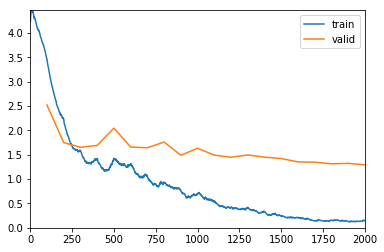

In [0]:
learn.fit_one_cycle(20,slice(1e-2))

In [0]:
learn.unfreeze()
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 9.12E-07
Min loss divided by 10: 9.12E-06


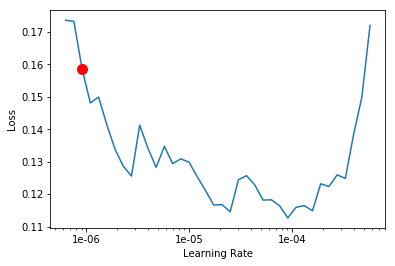

In [0]:
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,accuracy,time
0,0.125218,1.313079,0.710000,00:42
1,0.132429,1.352928,0.700000,00:41
2,0.130617,1.323602,0.675000,00:41
3,0.151125,1.293621,0.692500,00:41
4,0.130409,1.318172,0.672500,00:41
5,0.146836,1.339436,0.690000,00:41
6,0.140765,1.324456,0.687500,00:41
7,0.131375,1.288150,0.690000,00:41
8,0.145776,1.299852,0.695000,00:41
9,0.115414,1.299872,0.692500,00:42


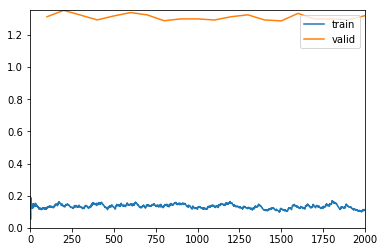

In [0]:
learn.fit_one_cycle(20,slice(1e-6))

In [0]:
learn.save('/content/gdrive/My Drive/models/esc50-res18-stage1')

In [0]:
learn.export('/content/gdrive/My Drive/models/esc50-res18-model-stage1.pkl')

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

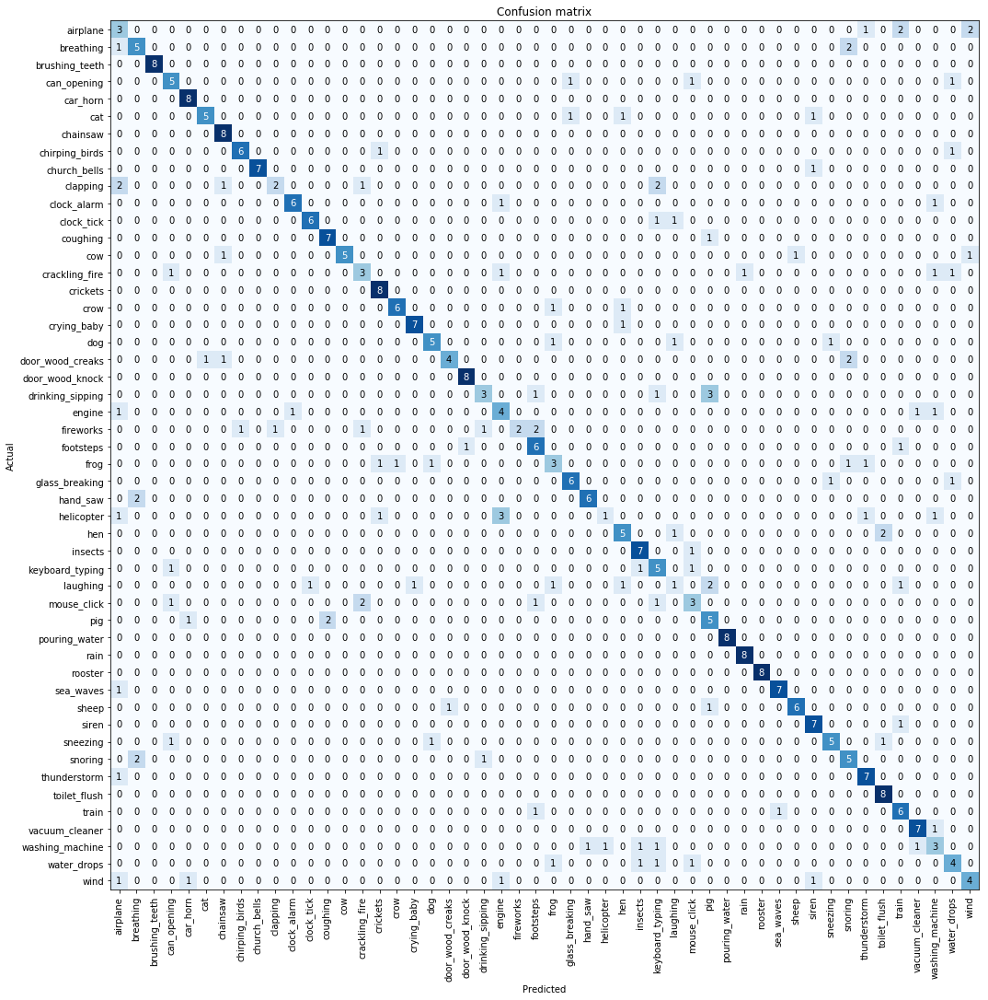

In [0]:
interp.plot_confusion_matrix(figsize=(15,15))

In [0]:
interp.most_confused(min_val=2)

[('drinking_sipping', 'pig', 3),
 ('helicopter', 'engine', 3),
 ('airplane', 'train', 2),
 ('airplane', 'wind', 2),
 ('breathing', 'snoring', 2),
 ('clapping', 'airplane', 2),
 ('clapping', 'keyboard_typing', 2),
 ('door_wood_creaks', 'snoring', 2),
 ('fireworks', 'footsteps', 2),
 ('hand_saw', 'breathing', 2),
 ('hen', 'toilet_flush', 2),
 ('laughing', 'pig', 2),
 ('mouse_click', 'crackling_fire', 2),
 ('pig', 'coughing', 2),
 ('snoring', 'breathing', 2)]

In [0]:
learn.purge()
learn = cnn_learner(db, models.resnet34, metrics=[accuracy],callback_fns=ShowGraph, pretrained=True)

In [0]:
learn.unfreeze()
learn.model.to(device='cuda')
learn.model.double()

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 3.63E-03
Min loss divided by 10: 2.29E-03


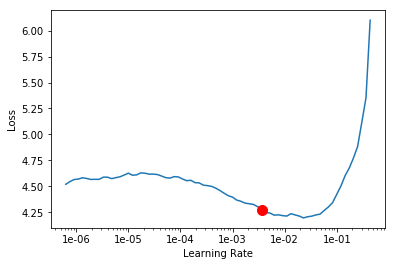

In [0]:
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,accuracy,time
0,4.061177,3.417804,0.157500,01:19
1,2.984039,2.275181,0.487500,01:19
2,1.768597,1.434359,0.595000,01:19
3,1.168997,1.282968,0.632500,01:19
4,0.895008,1.456312,0.615000,01:19
5,0.864166,1.440424,0.612500,01:19
6,0.628387,1.340080,0.647500,01:19
7,0.507185,1.279847,0.697500,01:19
8,0.512893,1.514684,0.615000,01:19
9,0.391546,1.164268,0.710000,01:19


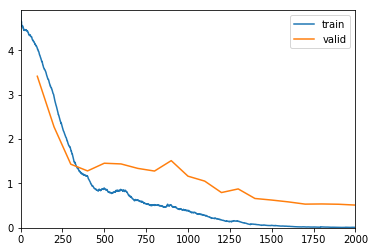

In [0]:
learn.fit_one_cycle(20,slice(2e-3))

In [0]:
learn.save('/content/gdrive/My Drive/models/esc50-res34-stage1')

In [0]:
learn.export('/content/gdrive/My Drive/models/esc50-res34-model-stage1')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Failed to compute the gradients, there might not be enough points.


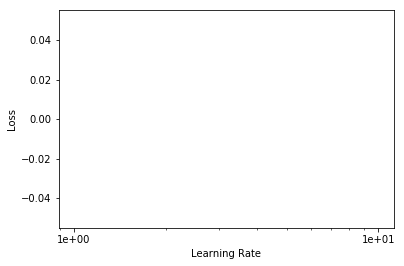

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,accuracy,time
0,0.010087,0.504690,0.862500,01:19
1,0.021148,0.568709,0.847500,01:19
2,0.018633,0.518854,0.857500,01:19
3,0.010077,0.540853,0.852500,01:19
4,0.007287,0.520759,0.867500,01:19
5,0.013100,0.543882,0.857500,01:19
6,0.010428,0.506034,0.870000,01:19
7,0.009948,0.568011,0.847500,01:19
8,0.011200,0.519546,0.862500,01:19
9,0.009425,0.554250,0.850000,01:19


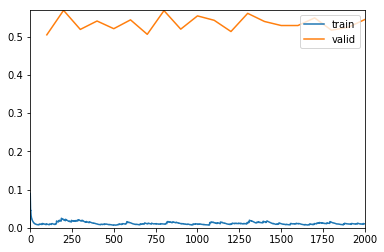

In [0]:
learn.fit_one_cycle(20,slice(1e-7))

In [0]:
learn.save('/content/gdrive/My Drive/models/esc50-res34-stage2')
learn.export('/content/gdrive/My Drive/models/esc50-res34-model-stage2')

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

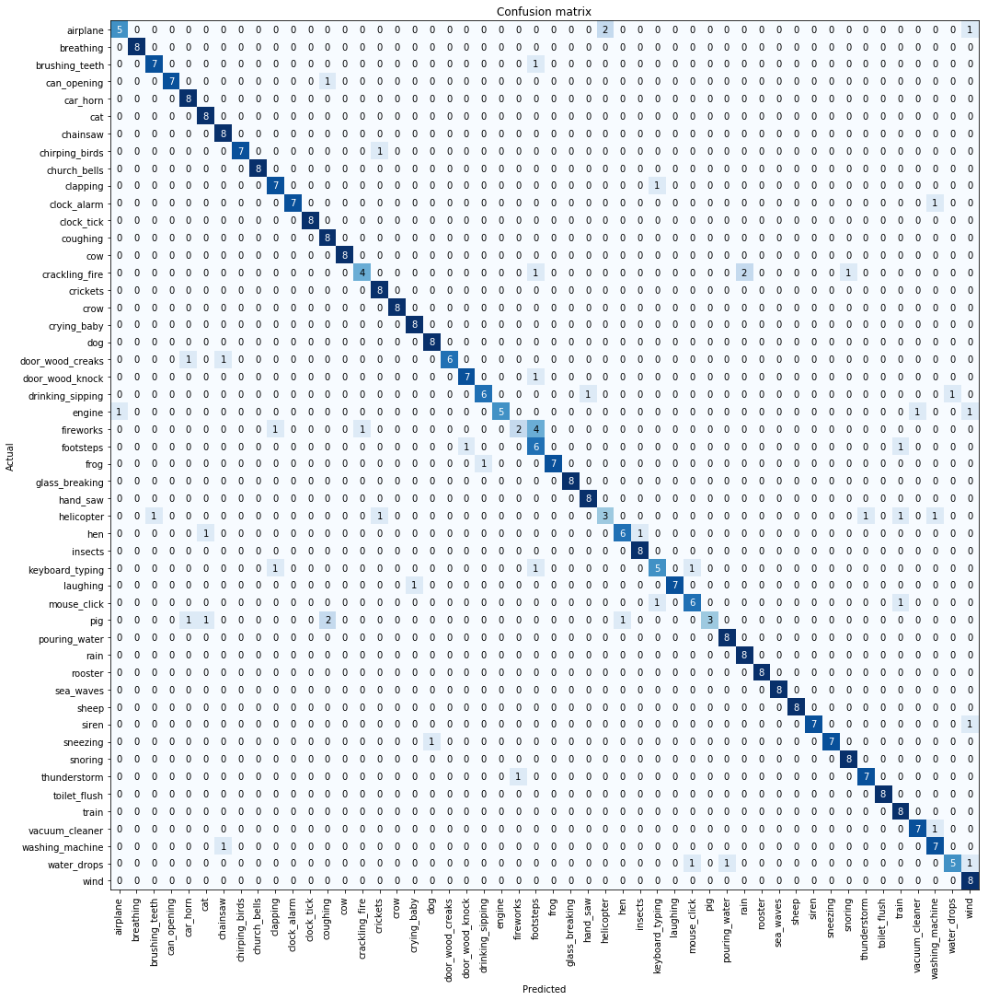

In [0]:
interp.plot_confusion_matrix(figsize=(15,15))

In [0]:
interp.most_confused(min_val=2)

[('fireworks', 'footsteps', 4),
 ('airplane', 'helicopter', 2),
 ('crackling_fire', 'rain', 2),
 ('pig', 'coughing', 2)]

In [0]:
learn = cnn_learner(db, models.resnet50, metrics=[accuracy],callback_fns=ShowGraph, pretrained=True)

In [0]:
learn.unfreeze()
learn.model.to(device='cuda')
learn.model=learn.model.double()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.10E-06
Min loss divided by 10: 1.58E-03


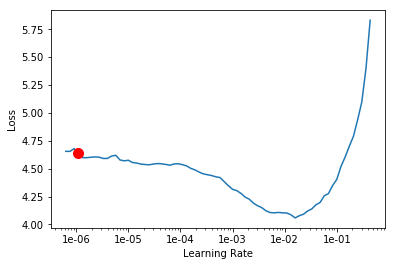

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,accuracy,time
0,3.676501,2.840671,0.317500,01:40
1,2.433927,1.904133,0.530000,01:41
2,1.545732,1.455501,0.592500,01:40
3,1.023368,1.230422,0.655000,01:41
4,0.745617,1.152166,0.690000,01:40
5,0.772796,1.363528,0.622500,01:40
6,0.751262,1.103795,0.672500,01:40
7,0.665968,1.400816,0.660000,01:40
8,0.578928,1.492675,0.622500,01:40
9,0.605072,1.930273,0.577500,01:40


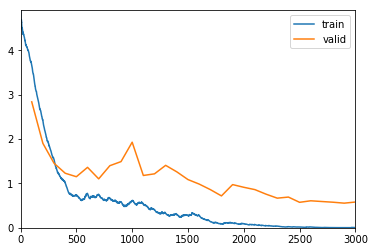

In [0]:
learn.fit_one_cycle(30,slice(2e-3))

In [0]:
learn.save('/content/gdrive/My Drive/models/esc50-res50-stage1')
learn.export('/content/gdrive/My Drive/models/esc50-res50-model-stage1.pkl')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.32E-06
Min loss divided by 10: 7.59E-08


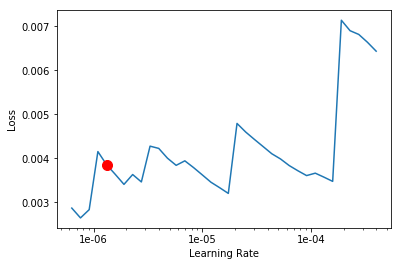

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

epoch,train_loss,valid_loss,accuracy,time
0,0.003793,0.565231,0.875000,01:40
1,0.009737,0.571185,0.860000,01:41
2,0.006211,0.581445,0.872500,01:40
3,0.003170,0.585695,0.857500,01:41
4,0.005396,0.579775,0.875000,01:40
5,0.005628,0.571581,0.865000,01:41
6,0.005093,0.559875,0.862500,01:40
7,0.005177,0.588064,0.872500,01:40
8,0.005586,0.578835,0.872500,01:40
9,0.005247,0.571592,0.870000,01:41


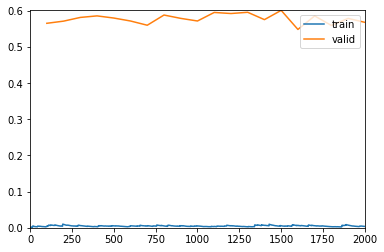

In [0]:
learn.fit_one_cycle(20,slice(5e-7))

In [0]:
learn.save('/content/gdrive/My Drive/models/esc50-res50-stage2')
learn.export('/content/gdrive/My Drive/models/esc50-res50-model-stage2')

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

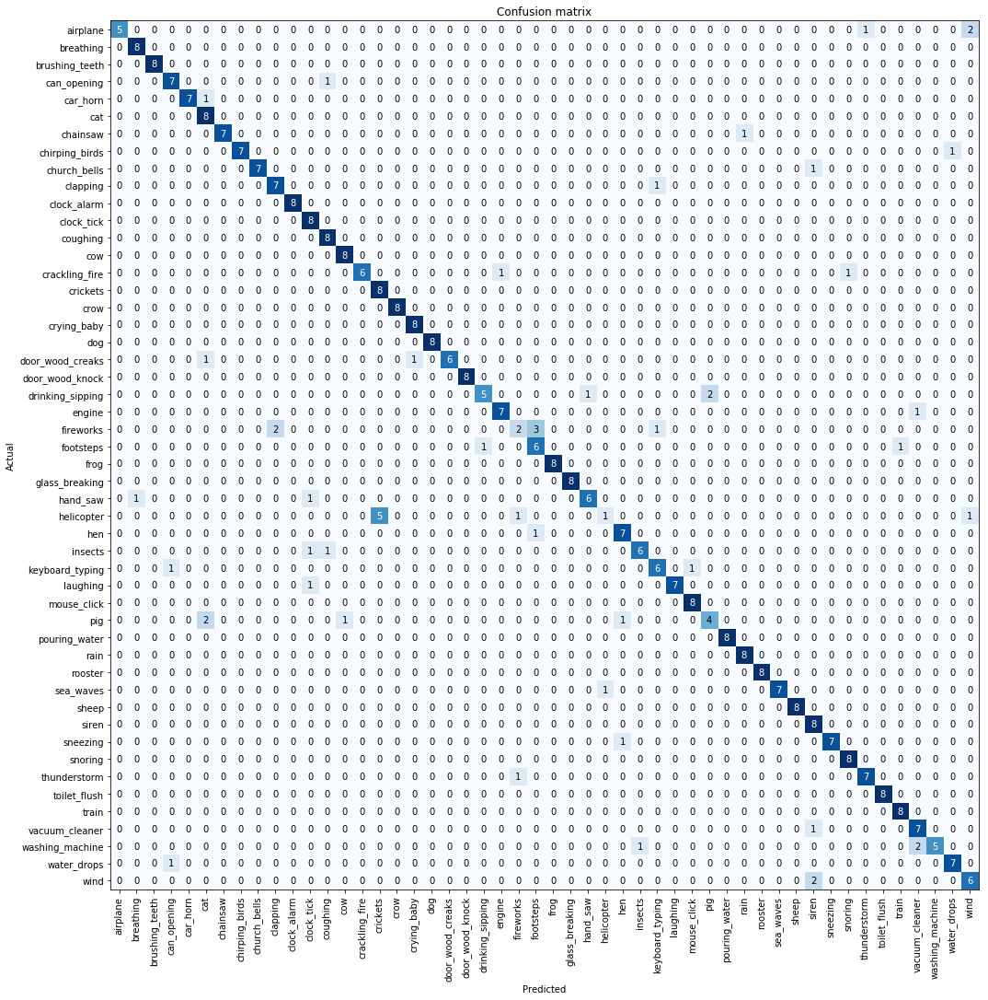

In [0]:
interp.plot_confusion_matrix(figsize=(15,15))

In [0]:
interp.most_confused(min_val=2)

[('helicopter', 'crickets', 5),
 ('fireworks', 'footsteps', 3),
 ('airplane', 'wind', 2),
 ('drinking_sipping', 'pig', 2),
 ('fireworks', 'clapping', 2),
 ('pig', 'cat', 2),
 ('washing_machine', 'vacuum_cleaner', 2),
 ('wind', 'siren', 2)]

In [0]:
learn = load_learner('/content/gdrive/My Drive/models','esc50-res50-model-stage2')

In [0]:
learn.unfreeze()
learn.model.to(device='cuda')
learn.model=learn.model.double()

In [0]:
learn.load('/content/gdrive/My Drive/models/esc50-res50-stage2')

Learner(data=DataBunch;

Train: LabelList (0 items)
x: ItemList

y: CategoryList

Path: /content/gdrive/My Drive/models;

Valid: LabelList (0 items)
x: ItemList

y: CategoryList

Path: /content/gdrive/My Drive/models;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_si

In [0]:
df.category.unique()

array(['dog', 'chirping_birds', 'vacuum_cleaner', 'thunderstorm', 'door_wood_knock', 'can_opening', 'crow', 'clapping',
       'fireworks', 'chainsaw', 'airplane', 'mouse_click', 'pouring_water', 'train', 'sheep', 'water_drops',
       'church_bells', 'clock_alarm', 'keyboard_typing', 'wind', 'footsteps', 'frog', 'cow', 'brushing_teeth',
       'car_horn', 'crackling_fire', 'helicopter', 'drinking_sipping', 'rain', 'insects', 'laughing', 'hen', 'engine',
       'breathing', 'crying_baby', 'hand_saw', 'coughing', 'glass_breaking', 'snoring', 'toilet_flush', 'pig',
       'washing_machine', 'clock_tick', 'sneezing', 'rooster', 'sea_waves', 'siren', 'cat', 'door_wood_creaks',
       'crickets'], dtype=object)

In [0]:
df[df['filename']=='1-116765-A-41.wav']

,filename,fold,target,category,esc10,src_file,take,is_valid
24,1-116765-A-41.wav,1,41,chainsaw,True,116765,A,False


In [0]:
import IPython
fln='/content/ESC-50-master/audio/1-116765-A-41.wav'
preprocessor=AudioPreProcessor('./')
smi=preprocessor.process_one(fln)
smit=torch.DoubleTensor(smi)
smit=smit.to(torch.device('cuda:0'))
pr=learn.model.forward(smit.reshape(1,*smit.shape))
IPython.display.display(IPython.display.Audio(filename=fln))
print([name for name, age in learn.data.c2i.items() if age == pr.argmax()][0])

chainsaw


In [0]:
!wget "http://soundbible.com/grab.php?id=2215&type=wav" -O "test.wav"

--2019-09-19 10:17:44--  http://soundbible.com/grab.php?id=2215&type=wav
Resolving soundbible.com (soundbible.com)... failed: Temporary failure in name resolution.
wget: unable to resolve host address ‘soundbible.com’


In [0]:
fln='test.wav'
preprocessor=AudioPreProcessor('./')
smi=preprocessor.process_one(fln)
smit=torch.DoubleTensor(smi)
smit=smit.to(torch.device('cuda:0'))
pr=learn.model.forward(smit.reshape(1,*smit.shape))
IPython.display.display(IPython.display.Audio(filename=fln))
[name for name, age in learn.data.c2i.items() if age == pr.argmax()][0]

'dog'

In [0]:
!wget "http://soundbible.com/grab.php?id=1954&type=wav" -O "cattest.wav"

--2019-09-19 10:20:42--  http://soundbible.com/grab.php?id=1954&type=wav
Resolving soundbible.com (soundbible.com)... failed: Temporary failure in name resolution.
wget: unable to resolve host address ‘soundbible.com’


In [0]:
fln='cattest.wav'
preprocessor=AudioPreProcessor('./')
smi=preprocessor.process_one(fln)
smit=torch.DoubleTensor(smi)
smit=smit.to(torch.device('cuda:0'))
pr=learn.model.forward(smit.reshape(1,*smit.shape))
IPython.display.display(IPython.display.Audio(filename=fln))
[name for name, age in learn.data.c2i.items() if age == pr.argmax()][0]

'cat'

In [0]:
!wget "http://soundbible.com/grab.php?id=2142&type=wav" -O "sirentest1.wav"

--2019-09-18 16:10:50--  http://soundbible.com/grab.php?id=2142&type=wav
Resolving soundbible.com (soundbible.com)... 65.181.113.249
Connecting to soundbible.com (soundbible.com)|65.181.113.249|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified []
Saving to: ‘sirentest1.wav’

sirentest1.wav          [       <=>          ]   1.36M   911KB/s    in 1.5s    

2019-09-18 16:10:52 (911 KB/s) - ‘sirentest1.wav’ saved [1429798]



In [0]:
fln='sirentest1.wav'
preprocessor=AudioPreProcessor('./')
smi=preprocessor.process_one(fln)
smit=torch.DoubleTensor(smi)
smit=smit.to(torch.device('cuda:0'))
pr=learn.model.forward(smit.reshape(1,*smit.shape))
IPython.display.display(IPython.display.Audio(filename=fln))
[name for name, age in learn.data.c2i.items() if age == pr.argmax()][0]

'cow'

In [0]:
!wget "http://soundbible.com/grab.php?id=1753&type=wav" -O "sirentest2.wav"

--2019-09-18 16:11:12--  http://soundbible.com/grab.php?id=1753&type=wav
Resolving soundbible.com (soundbible.com)... 65.181.113.249
Connecting to soundbible.com (soundbible.com)|65.181.113.249|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified []
Saving to: ‘sirentest2.wav’

sirentest2.wav          [              <=>   ]   1.63M   538KB/s    in 3.1s    

2019-09-18 16:11:16 (538 KB/s) - ‘sirentest2.wav’ saved [1709578]



In [0]:
fln='sirentest2.wav'
preprocessor=AudioPreProcessor('./')
smi=preprocessor.process_one(fln)
smit=torch.DoubleTensor(smi)
smit=smit.to(torch.device('cuda:0'))
pr=learn.model.forward(smit.reshape(1,*smit.shape))
IPython.display.display(IPython.display.Audio(filename=fln))
[name for name, age in learn.data.c2i.items() if age == pr.argmax()][0]

'siren'

In [0]:
df.head()

,filename,fold,target,category,esc10,src_file,take,is_valid
0,1-100032-A-0.wav,1,0,dog,True,100032,A,False
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A,False
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A,False
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B,False
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A,False


In [0]:
learn.data.c2i

{'airplane': 0,
 'breathing': 1,
 'brushing_teeth': 2,
 'can_opening': 3,
 'car_horn': 4,
 'cat': 5,
 'chainsaw': 6,
 'chirping_birds': 7,
 'church_bells': 8,
 'clapping': 9,
 'clock_alarm': 10,
 'clock_tick': 11,
 'coughing': 12,
 'cow': 13,
 'crackling_fire': 14,
 'crickets': 15,
 'crow': 16,
 'crying_baby': 17,
 'dog': 18,
 'door_wood_creaks': 19,
 'door_wood_knock': 20,
 'drinking_sipping': 21,
 'engine': 22,
 'fireworks': 23,
 'footsteps': 24,
 'frog': 25,
 'glass_breaking': 26,
 'hand_saw': 27,
 'helicopter': 28,
 'hen': 29,
 'insects': 30,
 'keyboard_typing': 31,
 'laughing': 32,
 'mouse_click': 33,
 'pig': 34,
 'pouring_water': 35,
 'rain': 36,
 'rooster': 37,
 'sea_waves': 38,
 'sheep': 39,
 'siren': 40,
 'sneezing': 41,
 'snoring': 42,
 'thunderstorm': 43,
 'toilet_flush': 44,
 'train': 45,
 'vacuum_cleaner': 46,
 'washing_machine': 47,
 'water_drops': 48,
 'wind': 49}

In [0]:
import pickle
with open('label_to_classes.pkl','wb') as f:
  pickle.dump(learn.data.c2i,f)

In [0]:
files.download('label_to_classes.pkl')